#  Early RPC cells Subclutering

This Python notebook performs an analysis of the cell types and their marker genes on provided 10X dataset. Specifically, we'll focus on subclustering Early RPC cells. The data set contains ~107,000 cells of which approximately a half come from E14, E18, and P2. 

## Table of contents:

  * <a href=#Reading>1 Reading in the data</a>
  * <a href=#Preprocessing>2 Pre-processing and visualization</a>
    * <a href=#QC>2.1 Quality Control</a>
    * <a href=#Normalization>2.2 Normalization</a> 
    * <a href=#Batch>2.3 Batch correction</a>
    * <a href=#HVG>2.4 Highly variable genes</a>
    * <a href=#Visualization>2.5 Visualization</a>
    * <a href=#CC>2.6 Cell cycle scoring</a>
  * <a href=#Downstream>3 Downstream analysis</a>
    * <a href=#Clustering>3.1 Clustering</a>
    * <a href=#Markers>3.2 Marker genes & cluster annotation</a>
    * <a href=#Subclustering>3.3 Subclustering</a>
  * <a href=#Summary>4 Summary</a>


# 0. Loading the libraries

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns



In [2]:
sc.logging.print_versions()

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.8
scanpy      1.8.2
sinfo       0.3.4
-----
PIL                         9.0.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
cached_property             1.5.2
cffi                        1.15.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.0
defusedxml                  0.7.1
entrypoints   

In [3]:
sc.settings.verbosity = 3            
sc.settings.set_figure_params(dpi=80, facecolor='white')
plt.rcParams['figure.figsize']=(6,6) #rescale figures

# 1. Reading in the data

The count matrix is provided in .mtx format and can be downloaded here: [10x_mouse_retina_development.mtx](https://www.dropbox.com/s/6d76z4grcnaxgcg/10x_mouse_retina_development.mtx?dl=0)

- matrix.mtx - The count matrix containing raw counts for barcodes. Rows correspond to cells and columns to genes
- genes.tsv - contains the ensembl IDs labelling the genes in each column of the counts matrix
- barcodes.tsv - contains the cell barcodes labelling the cells in each row of the counts matrix
- 10x_Mouse_retina_pData_umap2_CellType_annot_w_horiz.csv - Cellular Phenotype Data


Finally, the `Macosko_cell_cycle_genes.txt` contains a list of marker genes for different cell cycle phases. We'd use this file in the <a href=#CC>Cell cycle scoring</a> section to compute cell cycle scores, but will not particularly regress out cell cycle effects.


In [4]:
# Set up data loading
results_file = 'swrite10x/retsmart.h5ad'  
adata = sc.read_10x_mtx(
    'sdata10x',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading
cells = pd.read_csv('sdata10x/10x_Mouse_retina_pData_umap2_CellType_annot_w_horiz.csv')
adata.obs['CellType']=cells['umap2_CellType'].values
adata.obs['oCellType']=cells['old_CellType_annot'].values

adata.obs['Age']=cells['age'].values
adata.obs['Plate']=cells['sample'].values

adata=adata[(adata.obs['Age']=='E14') | (adata.obs['Age']=='E18') | (adata.obs['Age']=='P2'),:]



... reading from cache file cache\sdata10x-matrix.h5ad


Checking the total size of the data set

In [5]:
adata.shape

(60366, 27998)

We have 60366 cells and 27998 genes in the dataset.

<a id="Preprocessing"></a>

# 2 Pre-processing and visualization

<a id="QC"></a>

## 2.1 Quality control

Data quality control can be split into cell QC and gene QC. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads being picked up can indicate cell stress, as there is a low proportion of nuclear mRNA in the cell. It should be noted that high mitochondrial RNA fractions can also be biological signals indicating elevated respiration.


In [6]:
# Quality control - calculate QC covariates
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
adata.var['hb'] = adata.var_names.str.startswith(("Hba","Hbb","Hbq"))
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

# adata.obs['total_counts'] = adata.X.sum(1)
adata.obs['total_counts_log'] = np.log10(adata.obs['total_counts'])


Trying to set attribute `.var` of view, copying.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


C:\ProgramData\Anaconda3\envs\retisepi\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'CellType' as categorical
C:\ProgramData\Anaconda3\envs\retisepi\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'oCellType' as categorical
C:\ProgramData\Anaconda3\envs\retisepi\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future versi

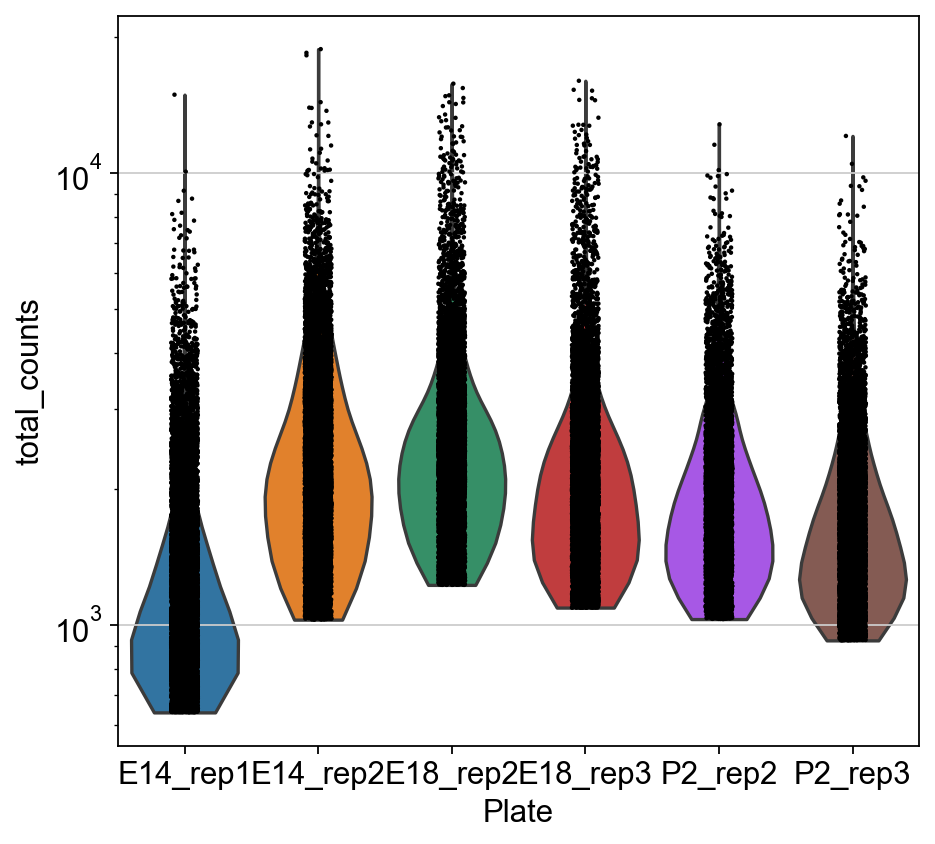

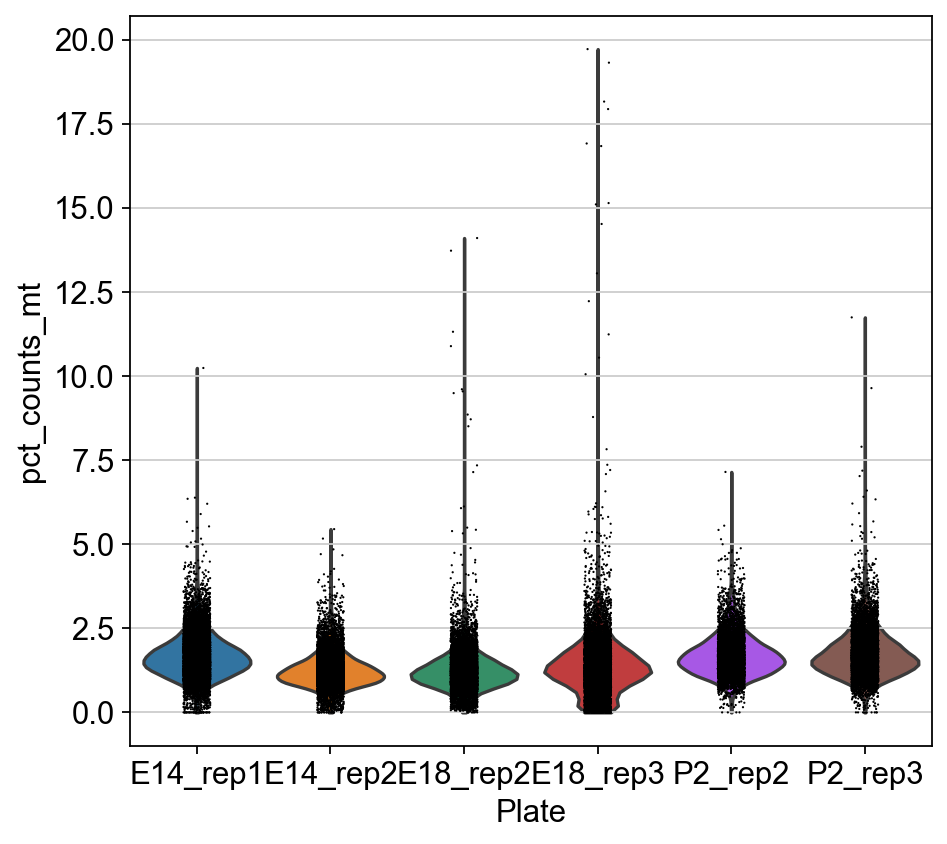

In [7]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'total_counts', groupby='Plate', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'pct_counts_mt', groupby='Plate')


The plots show that the samples have comparable quality.

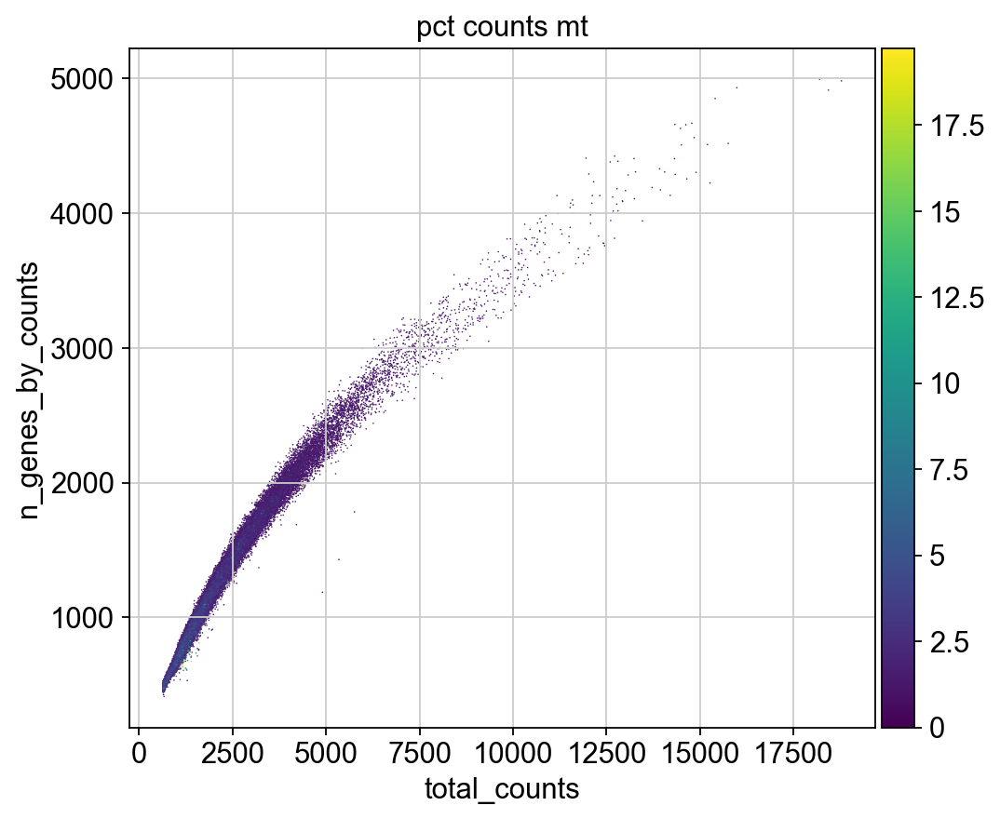

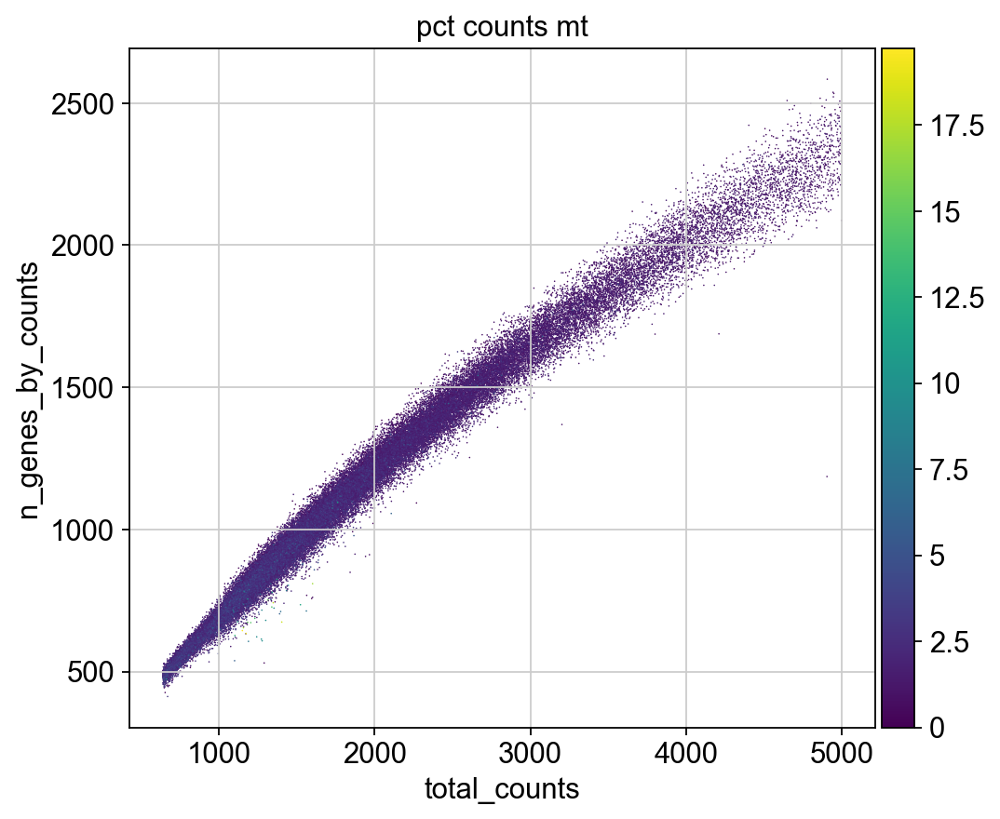

In [8]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')
p2 = sc.pl.scatter(adata[adata.obs['total_counts']<5000], 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

By looking at plots of the number of genes versus the number of counts with MT fraction information, we can assess whether there cells with unexpected summary statistics. It is important here to look at these statistics jointly. We should probably filter out some cells with very few genes as these may be difficult to annotate later. This will be true for the initial cellular density between 1000-10000 counts and < ~500 genes.

Furthermore it can be seen in the main cloud of data points, that cells with lower counts and genes tend to have a higher fraction of mitochondrial counts. These cells are likely under stress or are dying. When apoptotic cells are sequenced, there is less mRNA to be captured in the nucleus, and therefore fewer counts overall, and thus a higher fraction of counts fall upon mitochondrial RNA. If cells with high mitochondrial activity were found at higher counts/genes per cell, this would indicate biologically relevant mitochondrial activity.

C:\ProgramData\Anaconda3\envs\retisepi\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_counts'>

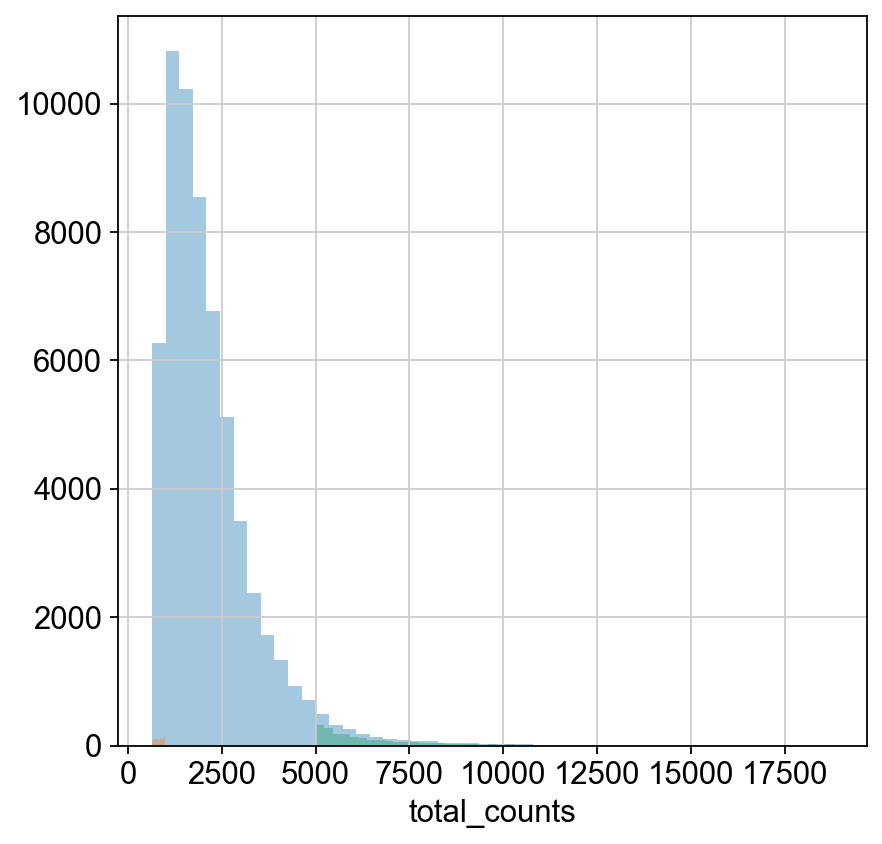

In [9]:
#Thresholding decision: counts
sns.distplot(adata.obs['total_counts'], kde=False)

sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']<1000], kde=False, bins=60)

sns.distplot(adata.obs['total_counts'][adata.obs['total_counts']>5000], kde=False, bins=60)


Histograms of the number of counts per cell show that there are two small peaks of groups of cells with fewer than 1500 counts. which are likely uninformative given the overall distribution of counts. This may be cellular debris found in droplets.

On the upper end of counts, we see a population of cells with high counts shown as a broad peak at 20,000 counts. We estimate this population to range until 40,000 counts. This estimation is performed by visually tracing a Gaussian around the population.

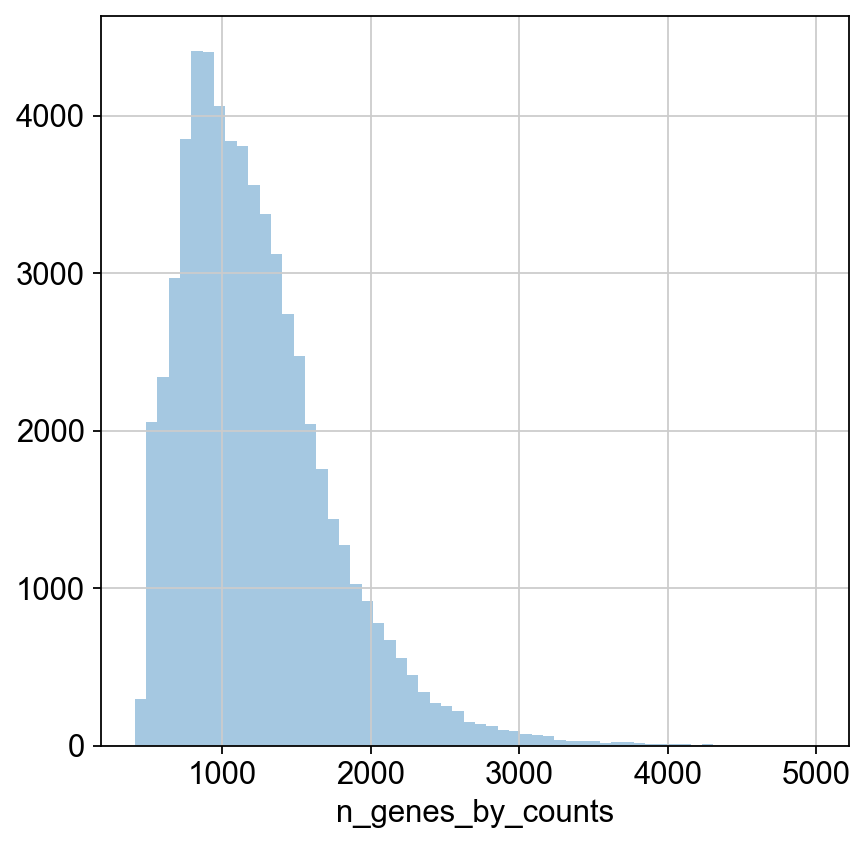

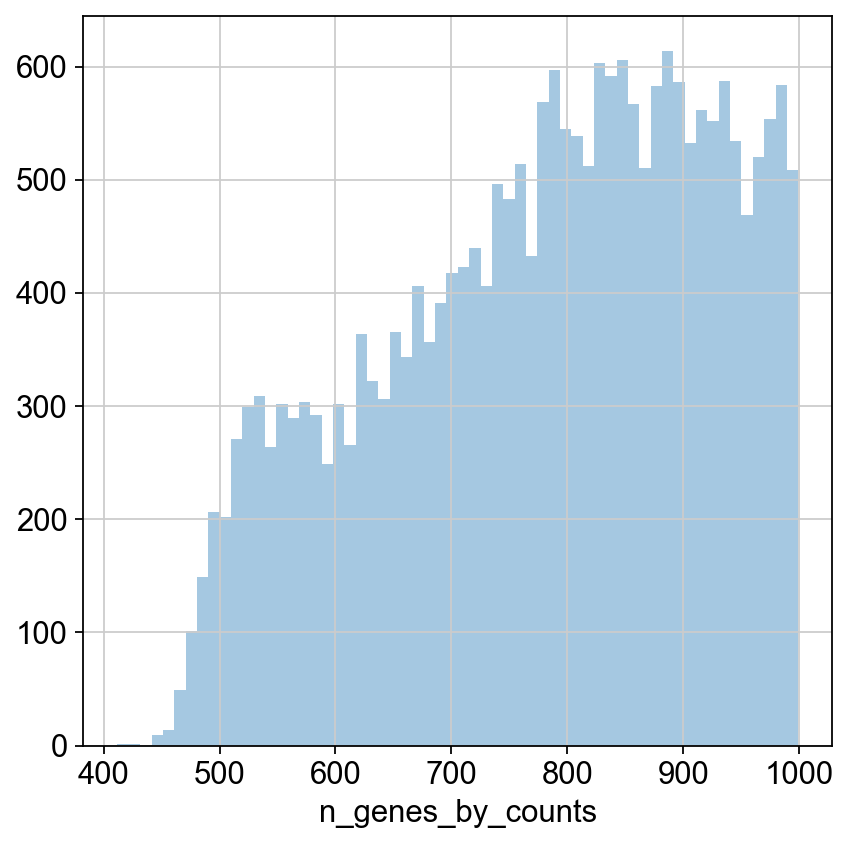

In [10]:
#Thresholding decision: genes
p6 = sns.distplot(adata.obs['n_genes_by_counts'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1000], kde=False, bins=60)
plt.show()


Two populations of cells with low gene counts can be seen in the above plots. Given these plots, and the plot of genes vs counts above, we decide to filter out cells with fewer than 700 genes expressed. Below this we are likely to find dying cells or empty droplets with ambient RNA. Looking above at the joint plots, we see that we filter out the main density of low gene cells with this threshold.

In general it is a good idea to be permissive in the early filtering steps, and then come back to filter out more stringently when a clear picture is available of what would be filtered out. This is available after visualization/clustering. For demonstration purposes we stick to a simple (and slightly more stringent) filtering here.

In [11]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 1000)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 10000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['pct_counts_mt'] < 5]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 700)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))





Total number of cells: 60366
filtered out 6169 cells that have less than 1000 counts
Number of cells after min count filter: 54197
filtered out 144 cells that have more than 10000 counts
Number of cells after max count filter: 54053
Number of cells after MT filter: 53965
filtered out 874 cells that have less than 700 genes expressed


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 53091


In [12]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 27998
filtered out 11623 genes that are detected in less than 10 cells
Number of genes after cell filter: 16375


The filtering is performed based on the thresholds we identified from the QC plots. Genes are also filtered if they are not detected in at least 20 cells. This reduces the dimensions of the matrix by removing 0 count genes and genes which are not sufficiently informative of the dataset. 

<a id="Normalization"></a>

## 2.2 Normalization

Up to this point the data is only available as a count matrix. Counts are representative of molecules that were captured in the scRNA-seq experiment. As not all mRNA molecules in a cell are captured, there is a variability in the total number of counts detected between cells that results from both the number of molecules that were in the cells, and the sampling. 


In [13]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)
sc.pp.log1p(adata)




normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Before normalizing the data, we filter out ribosormal and mitochondrial genes so that downstream analysis to find marker genes which are based on the raw data does not include these genes. 

In [14]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
bdata=adata.copy()
remove= np.add(bdata.var['ribo'], adata.var['mt'])

keep=np.invert(remove)
bdata=bdata[:,keep]
adata.raw = bdata

The count data has been normalized and log-transformed with an offset of 1. The latter is performed to normalize the data distributions. The offset of 1 ensures that zero counts map to zeros. We keep this data in the '.raw' part of the AnnData object as it will be used to visualize gene expression and perform statistical tests such as computing marker genes for clusters.

## 2.3 Batch Correction

Batch correction is performed to adjust for batch effects from the samples that were loaded. Note that ComBat batch correction requires a dense matrix format as input, and this may need a large memory size. It doesn't yield so much difference in our analysis, so we opt not to perform this analysis.


In [15]:
# ComBat batch correction
# sc.pp.combat(adata, key='Plate')

Note ComBat batch correction can produce negative expression values. One can either set all negative values to 0 or force zeros pre-batch-correction to remain zero post-batch-correction. For simplicity we opt not to do this here.

## 2.4 Highly Variable Genes

We extract highly variable genes (HVGs) to further reduce the dimensionality of the dataset and include only the most informative genes. Genes that vary substantially across the dataset are informative of the underlying biological variation in the data. As we only want to capture biological variation in these genes, we select highly variable genes after normalization and batch correction. HVGs are used for clustering, trajectory inference, and dimensionality reduction/visualization, while the full data set is used for computing marker genes, differential testing, cell cycle scoring, and visualizing expression values on the data.

Here we use a standard technique for the extraction of highly variable genes from the 10X genomics preprocessing software CellRanger. Typically between 1000 and 5000 genes are selected. Here, we extract the top 4000 most variable genes for further processing. If particular genes of importance are known, one could assess how many highly variable genes are necessary to include all, or the majority, of these.


In [16]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


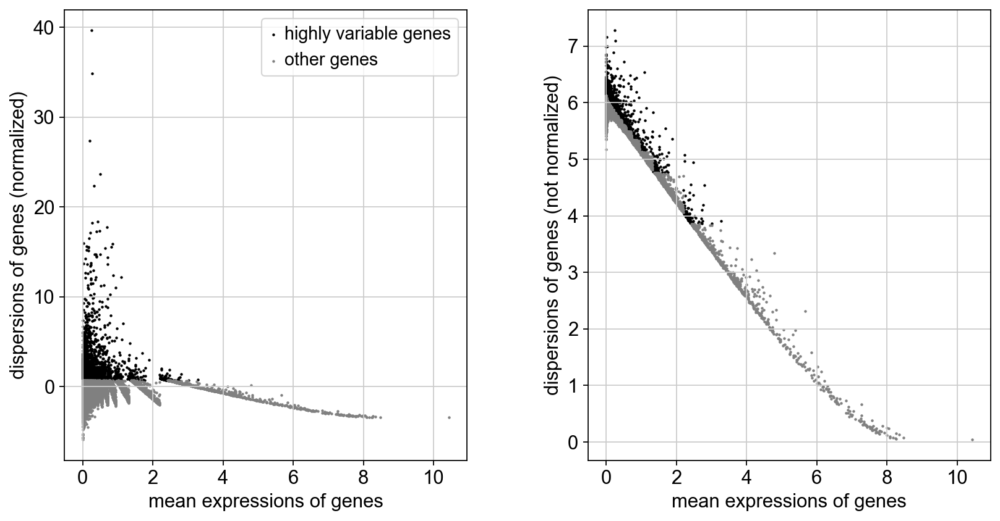

In [17]:
sc.pl.highly_variable_genes(adata)

The plots show how the data was normalized to select highly variable genes irrespective of the mean expression of the genes. This is achieved by using the index of dispersion which divides by mean expression, and subsequently binning the data by mean expression and selecting the most variable genes within each bin.

Highly variable gene information is stored automatically in the adata.var['highly_variable'] field. The dataset now contains:
- a 'counts' layer with count data
- log-normalized data in adata.raw
- highly variable gene annotations in adata.var['highly_variable']

The HVG labels will be used to subselect genes for clustering and trajectory analysis.

## 2.5 Visualization

Visualizing scRNA-seq data is the process of projecting a high-dimensional matrix of cells and genes into a few coordinates such that every cell is meaningfully represented in a two-dimensional graph. However, the visualization of scRNA-seq data is an active area of research and each method defines 'meaningful' in its own way. Thus, it is a good idea to look at several visualizations and decide which visualization best represents the aspect of the data that is being investigated. 

Overall t-SNE visualizations have been very popular in the community, however the recent UMAP algorithm has been shown to better represent the topology of the data.

Note that we do not scale the genes to have zero mean and unit variance. A lack of rescaling is equivalent to giving genes with a higher mean expression a higher weight in dimensionality reduction (despite correcting for mean offsets in PCA, due to the mean-variance relationship). We argue that this weighting based on mean expression being a biologically relevant signal. However, rescaling HVG expression is also common, and the number of publications that use this approach suggests that scaling is at least not detrimental to downstream scRNA-seq analysis.


In [18]:
# Calculate the visualizations

sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.umap(adata)
sc.tl.diffmap(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:32)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99715614 0.99469095 0.9940841  0.9852212  0.98087466
     0.9788415  0.9772205  0.972363   0.97155565 0.96575826 0.9626675
     0.95680493 0.9542863  0.95038205]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)


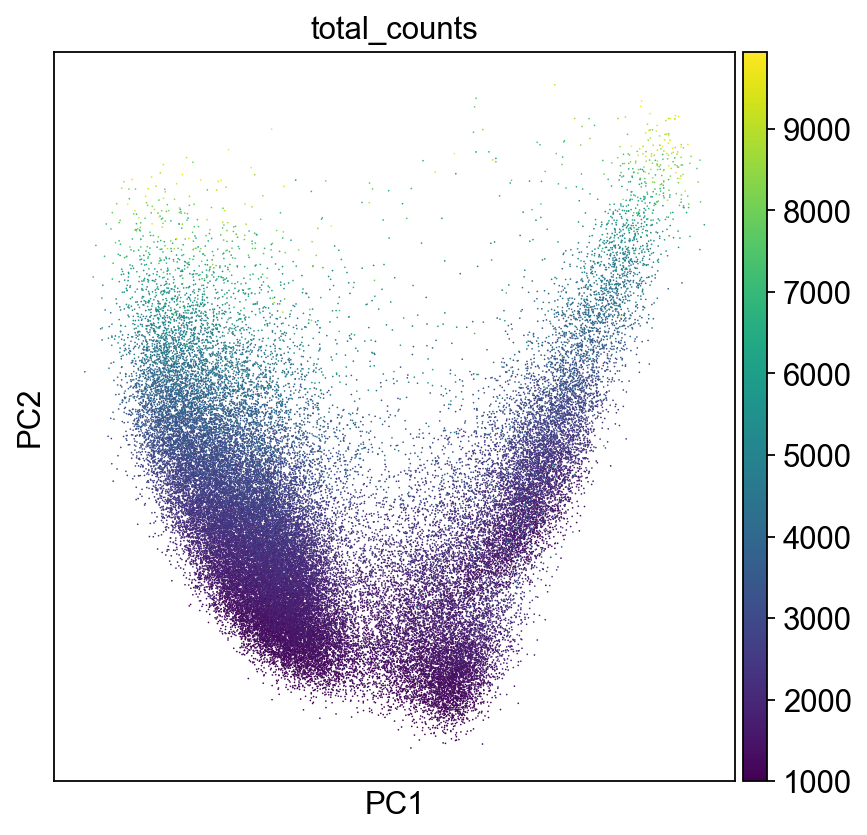

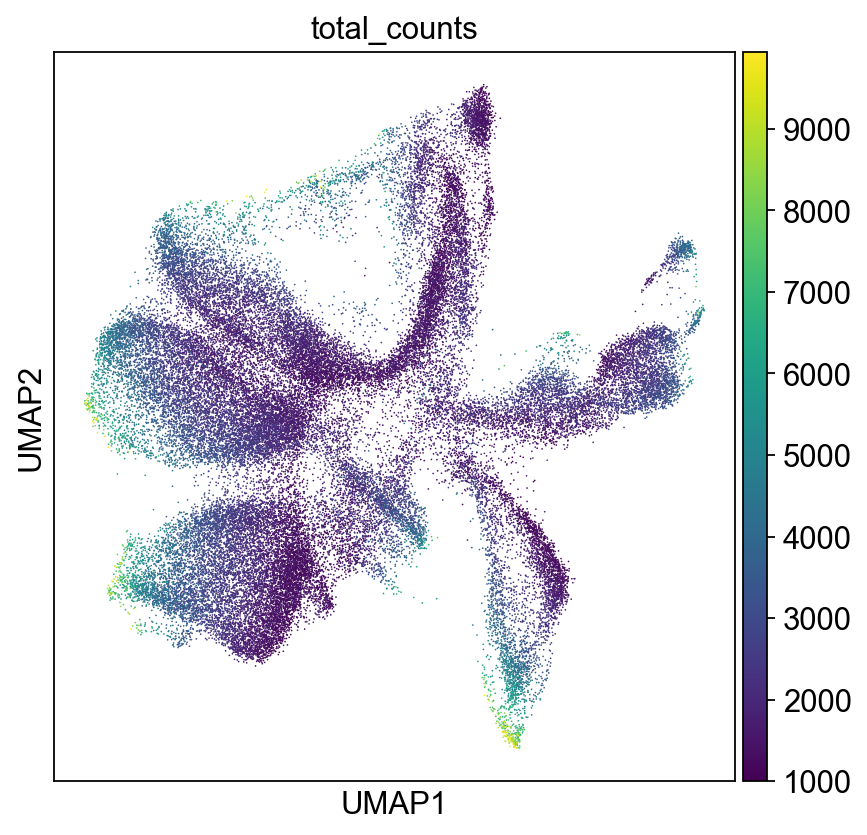

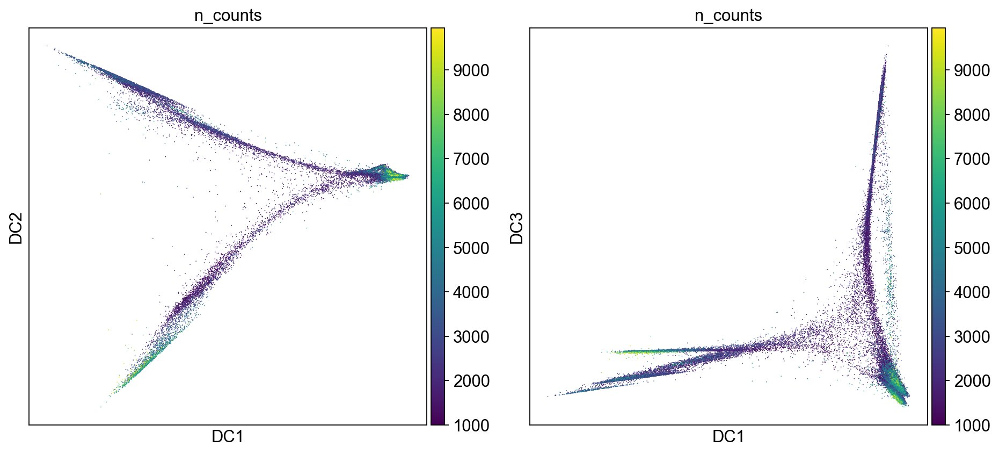

In [19]:

sc.pl.pca_scatter(adata, color='total_counts')
sc.pl.umap(adata, color='total_counts')
sc.pl.diffmap(adata, color='n_counts', components=['1,2','1,3'])



PCA:
- Unsurprisingly, the first principle component captures variation in count depth between cells, and is thus only marginally informative
- The plot does not show the expected clustering of the data in two dimensions

UMAP:
- Data points are spread out on the plot showing several clusters
- Connections between clusters can be readily identified

Diffusion Maps:
- Shows connections between regions of higher density
- Very clear trajectories are suggested, but clusters are less clear
- Each diffusion component extracts heterogeneity in a different part of the data


The strengths and weaknesses of the visualizations can readily be identified in the above plots. While t-SNE exaggerates differences, diffusion maps exaggerate transitions. Overall UMAP and force-directed graph drawings show the best compromise of the two aspects, however UMAP is much faster to compute (8s vs 114s here). UMAP has furthermore been shown to more accurately display the structure in the data.

<a id="CC"></a>

## 2.6 Cell cycle scoring

Known sources of technical variation in the data have been investigated and corrected for (e.g. count depth). A known source of biological variation that can explain the data is the cell cycle. Here, a gene list from Macosko et al., Cell 161 (2015) is used to score the cell cycle effect in the data and classify cells by cell cycle phase. The file can be found on the single-cell-tutorial github repository, or be taken from the supplementary material of the paper.

We perform cell cycle scoring on the full data set in adata.


In [20]:
#Score cell cycle and visualize the effect:
cc_genes_file = 'sdata10x/Macosko_cell_cycle_genes.txt'

cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()

s_genes_mm = [gene.lower().capitalize() for gene in s_genes]
g2m_genes_mm = [gene.lower().capitalize() for gene in g2m_genes]

s_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, s_genes_mm)]
g2m_genes_mm_ens = adata.var_names[np.in1d(adata.var_names, g2m_genes_mm)]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    1944 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    1846 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


C:\ProgramData\Anaconda3\envs\retisepi\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'phase' as categorical


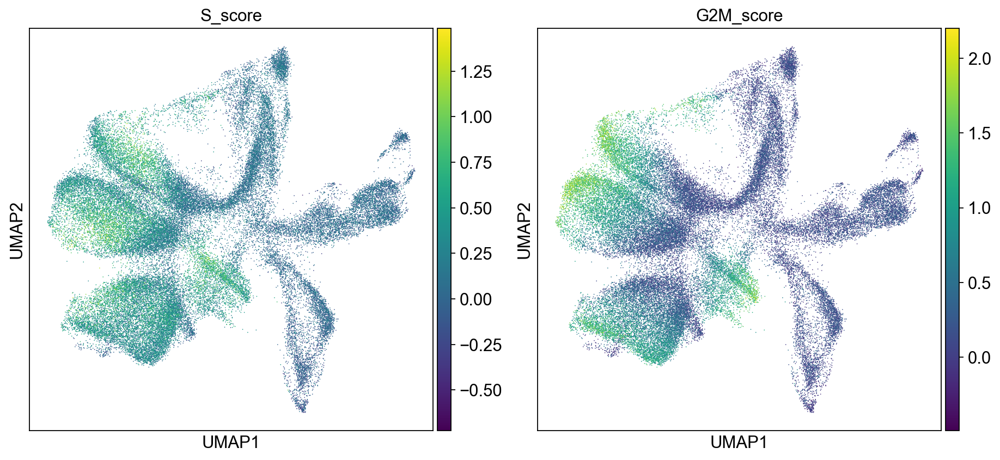

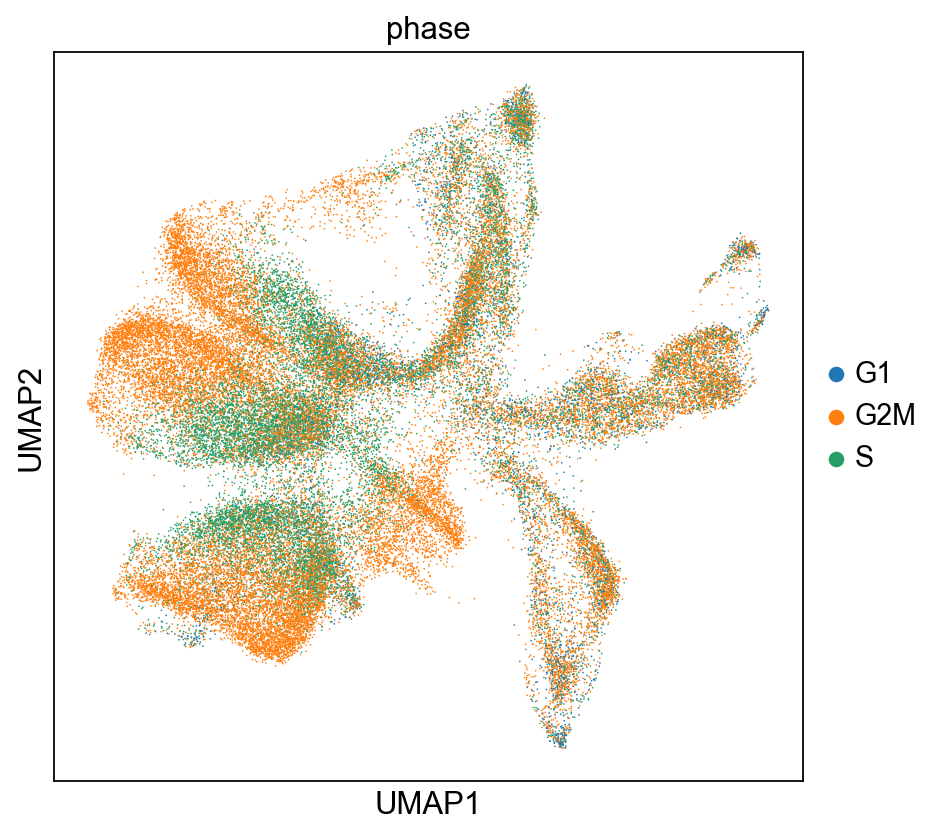

In [21]:
sc.pl.umap(adata, color=['S_score', 'G2M_score'], use_raw=False)
sc.pl.umap(adata, color='phase', use_raw=False)

Cell cycle scoring shows a pronounced proliferation signal in the largest central cluster in the Umap representation. This suggests a proliferation phenotype in these cells. Other clusters also show less pronouced cell cycle structure.

# 3 Downstream analysis

<a id="Clustering"></a>

## 3.1 Clustering

Clustering is a central component of the scRNA-seq analysis pipeline. To understand the data, we must identify cell types and states present. The first step of doing so is clustering. Performing Modularity optimization by Louvain community detection on the k-nearest-neighbour graph of cells has become an established practice in scRNA-seq analysis. Thus, this is the method of choice in this analysis as well.

Here, we perform clustering at two resolutions. Investigating several resolutions allows us to select a clustering that appears to capture the main clusters in the visualization and can provide a good baseline for further subclustering of the data to identify more specific substructure.

Clustering is performed on the highly variable gene data, dimensionality reduced by PCA, and embedded into a KNN graph. (see `sc.pp.pca()` and `sc.pp.neighbors()` functions used in the visualization section.


In [22]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0_5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:09)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain_r0_5', the cluster labels (adata.obs, categorical) (0:00:15)


In [23]:
adata.obs['louvain_r0_5'].value_counts()

0    12713
1     9961
2     9285
3     6999
4     5461
5     4189
6     2448
7     1623
8      412
Name: louvain_r0_5, dtype: int64

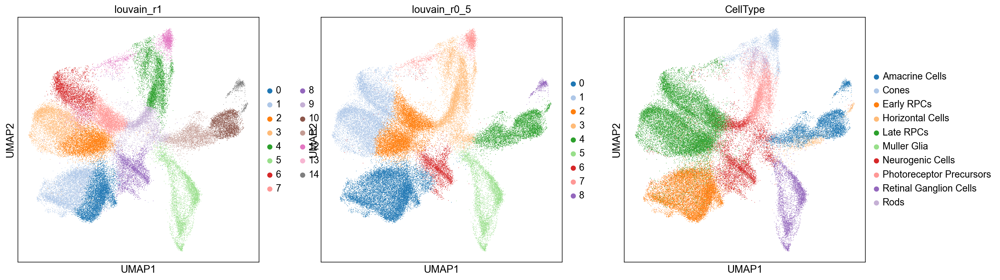

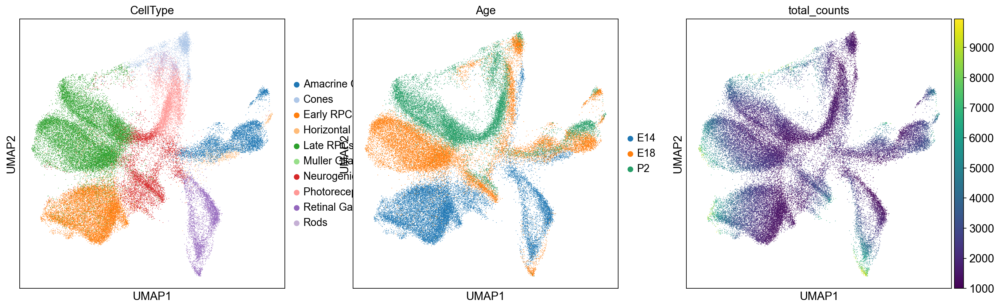

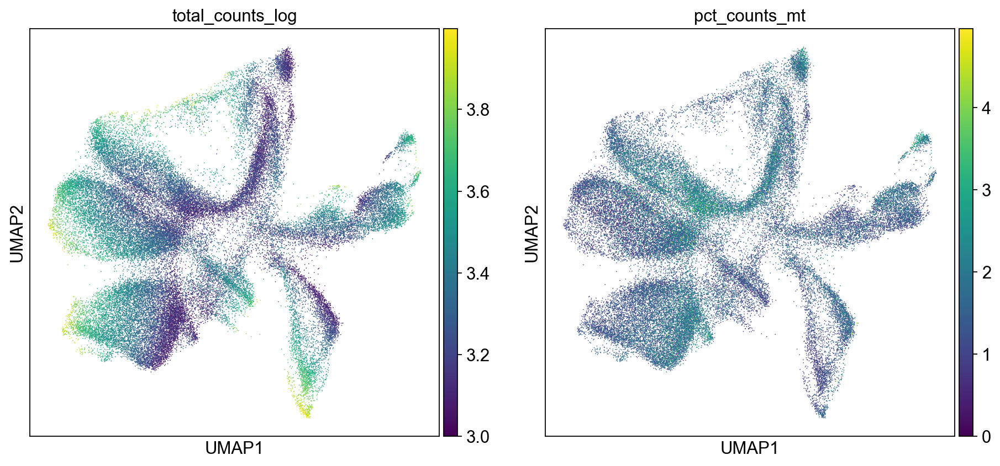

In [24]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['louvain_r1', 'louvain_r0_5','CellType'], palette=sc.pl.palettes.vega_20)
sc.pl.umap(adata, color=['CellType', 'Age', 'total_counts'])
sc.pl.umap(adata, color=['total_counts_log', 'pct_counts_mt'])

At a resolution of 0.5 the broad clusters in the visualization are captured well in the data. In the covariate plots, if a cluster  characterized by low counts, and is also characterized by higher mitochondrial read fractions, this indicates cell stress.

## 3.2 Marker genes & cluster annotation

To annotate the clusters we obtained, we find genes that are up-regulated in the cluster compared to all other clusters (marker genes). This differential expression test is performed by a Welch t-test . This is the default in scanpy. The test is automatically performed on the `.raw` data set, which is uncorrected and contains all genes. All genes are taken into account, as any gene may be an informative marker.


In [25]:
#Calculate marker genes
sc.tl.rank_genes_groups(adata, groupby='louvain_r0_5', key_added='rank_genes_r0.5')

ranking genes
    finished: added to `.uns['rank_genes_r0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


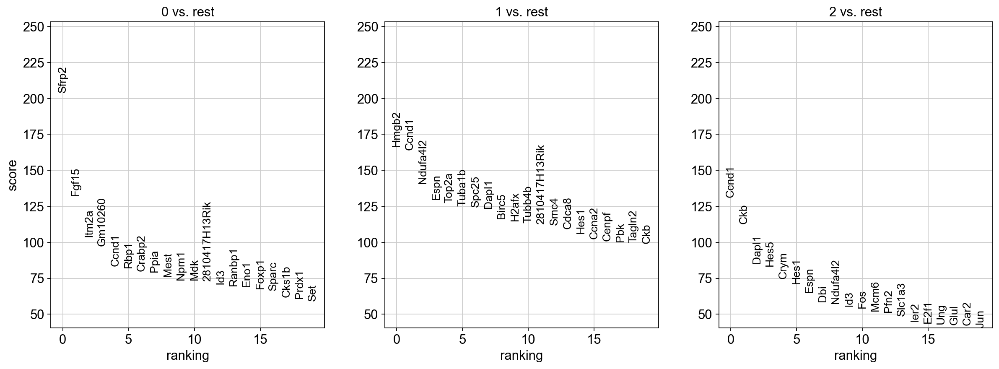

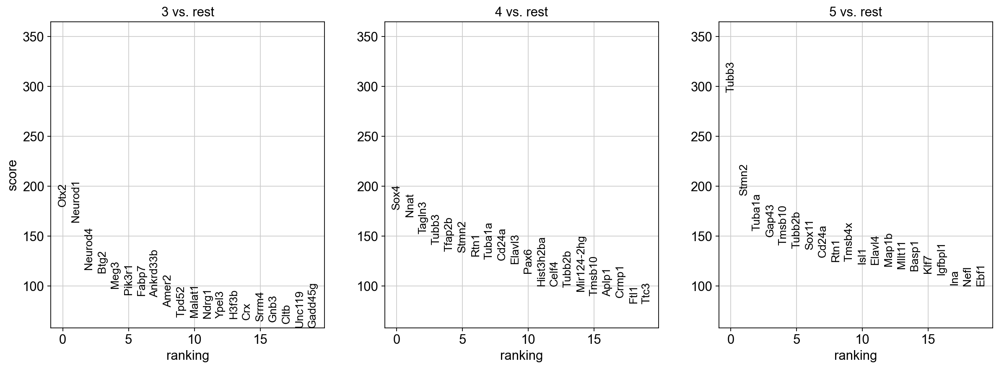

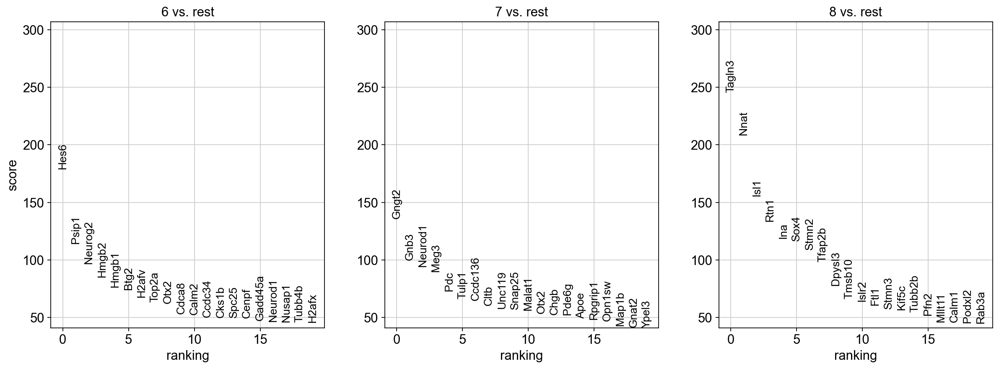

In [26]:
#Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['3','4','5'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['6', '7', '8'], fontsize=12)

In [27]:
pd.DataFrame(adata.uns['rank_genes_r0.5']['names']).head(10)


,0,1,2,3,4,5,6,7,8
0,Sfrp2,Hmgb2,Ccnd1,Otx2,Sox4,Tubb3,Hes6,Gngt2,Tagln3
1,Fgf15,Ccnd1,Ckb,Neurod1,Nnat,Stmn2,Psip1,Gnb3,Nnat
2,Itm2a,Ndufa4l2,Dapl1,Neurod4,Tagln3,Tuba1a,Neurog2,Neurod1,Isl1
3,Gm10260,Espn,Hes5,Btg2,Tubb3,Gap43,Hmgb2,Meg3,Rtn1
4,Ccnd1,Top2a,Crym,Meg3,Tfap2b,Tmsb10,Hmgb1,Pdc,Ina
5,Rbp1,Tuba1b,Hes1,Pik3r1,Stmn2,Tubb2b,Btg2,Tulp1,Sox4
6,Crabp2,Spc25,Espn,Fabp7,Rtn1,Sox11,H2afv,Ccdc136,Stmn2
7,Ppia,Dapl1,Dbi,Ankrd33b,Tuba1a,Cd24a,Top2a,Cltb,Tfap2b
8,Mest,Birc5,Ndufa4l2,Amer2,Cd24a,Rtn1,Otx2,Unc119,Dpysl3
9,Npm1,H2afx,Id3,Tpd52,Elavl3,Tmsb4x,Cdca8,Snap25,Tmsb10


To further identify the clusters in our data set, we look at the overlap with a list of known marker genes. Here, these marker genes were taken from the publication from which the data was obtained (Brian S Clark et al, 2019). 

In [28]:
#Known marker genes:
marker_genes = {
'Photo. Precurs.': ['Otx2','Neurod1','Prdm1'], 
'Neurogenetic': ['Atoh7','Hes6','Neurog2','Olig2'],
'RGCs': ['Pou4f2','Rbpms'],
'Amacrine Cells': ['Pax6','Tfap2a','Tfap2b'],
'Muller Glia': ['Clu','Aqp4','Rlbp1'],
'Rods': ['Rcvrn','Nrl','Rho'],
'Cones': ['Rax','Opn1sw','Thrb'],
'Horizontal Cells': ['Onecut1','Lhx1','Onecut2'],
'Late RPCs': ['Nfib','Nfia','Nfix','Hes5','Ccnd1','Hes1'],
'Early RPCs': ['Cdk4','Fgf15','Sfrp2']
}

In [29]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r0.5')
cell_annotation

,0,1,2,3,4,5,6,7,8
Photo. Precurs.,0.0,0.0,0.0,3.0,0.0,0.0,2.0,3.0,0.0
Neurogenetic,0.0,0.0,1.0,1.0,0.0,0.0,3.0,0.0,1.0
RGCs,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
Amacrine Cells,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0
Muller Glia,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Rods,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
Cones,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0
Horizontal Cells,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Late RPCs,1.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
Early RPCs,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


We can also visualize the marker gene overlap as a fraction of the total marker genes, and then plot this as a heatmap for simpler cell identity annotation.

<AxesSubplot:>

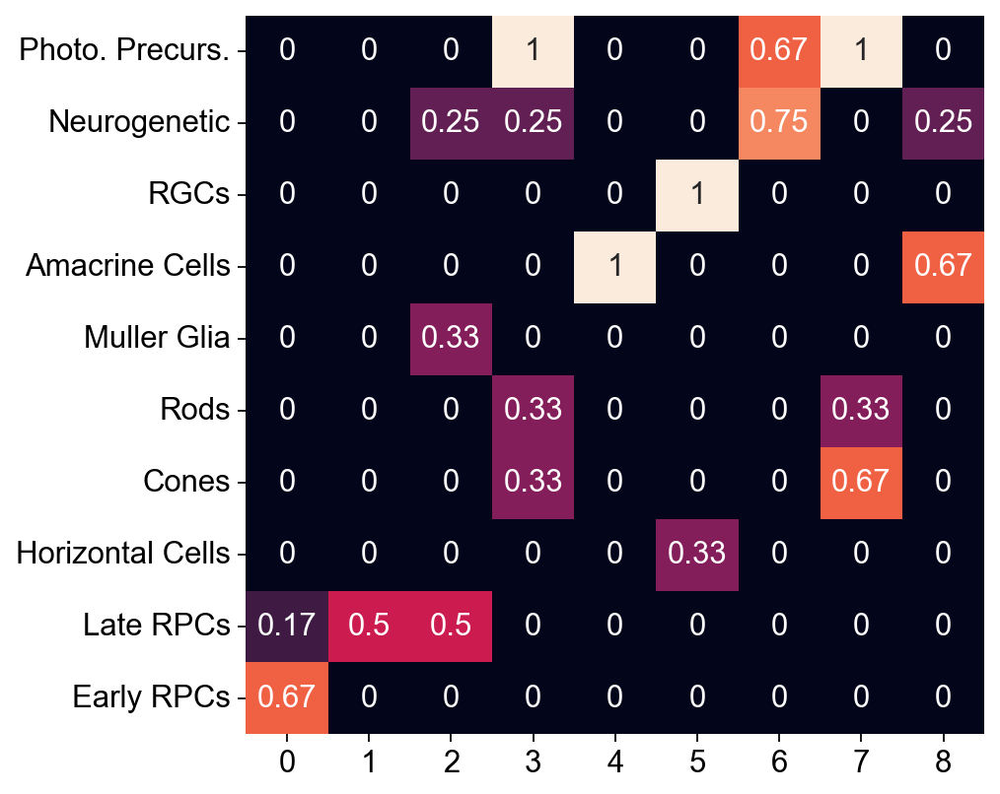

In [30]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r0.5', normalize='reference')
plt.figure()
sns.heatmap(cell_annotation_norm, cbar=False, annot=True)

We will visualize the expression of Early RPC markers to show the respective populations.

In [31]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

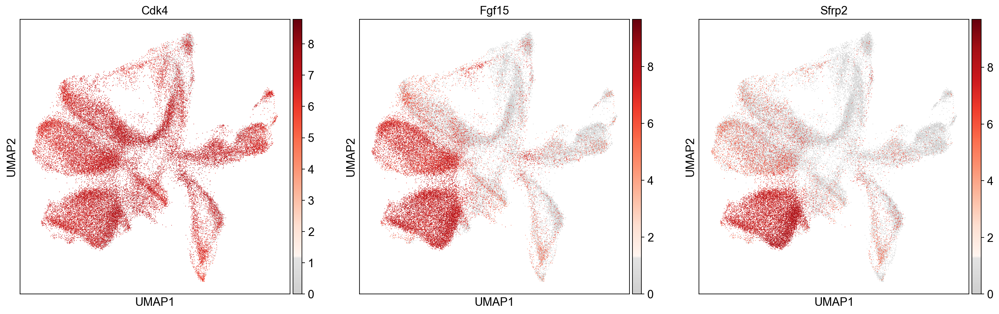

In [32]:
# Early RPC markers 
sc.pl.umap(adata, color=marker_genes['Early RPCs'], use_raw=False, color_map=mymap)
# sc.pl.umap(adata, color='Tff3', use_raw=False, color_map=mymap)


It is possible that a known marker is expressed in a cluster although it is not a marker gene for this cluster given its expression in another cluster is higher. This can be the case especially for progenitor cells. We visualize gene expression on the full data set in adata.

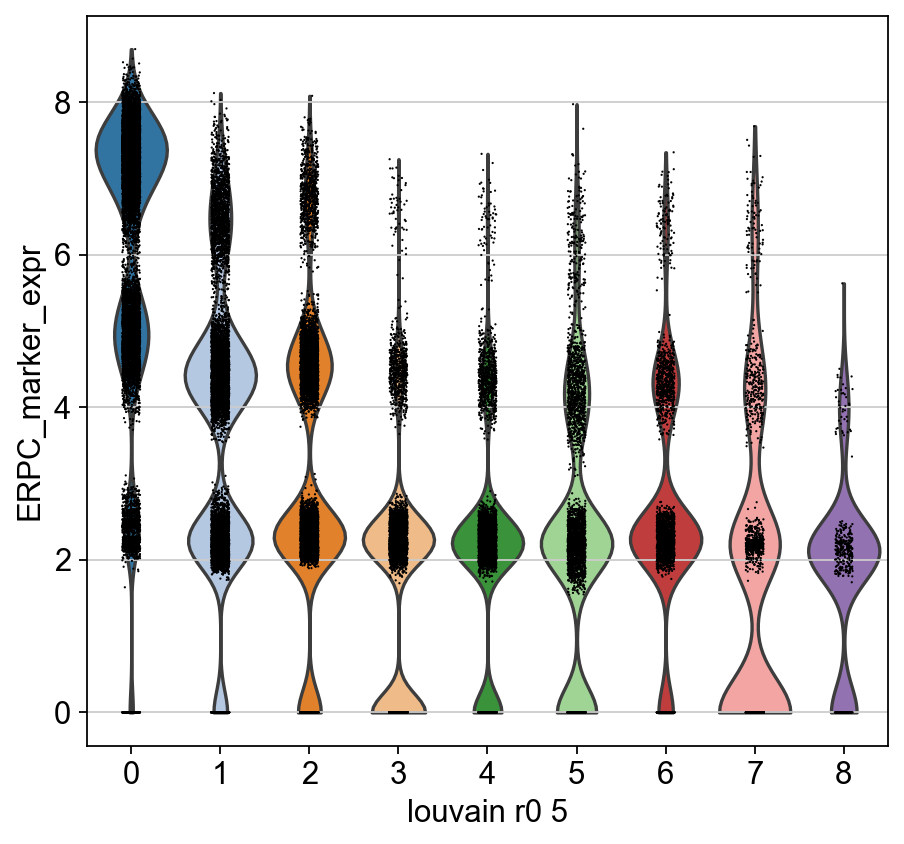

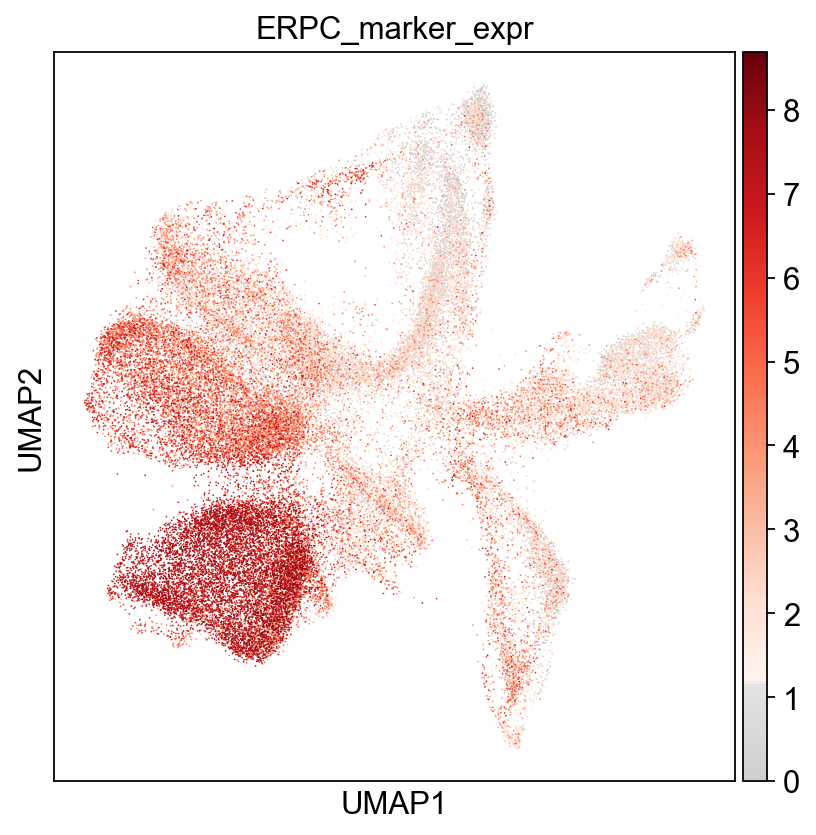

In [33]:
# Check expression of enterocyte markers
#Collate all enterocyte markers and get the gene IDs in the data set
ids_erpc = np.in1d(adata.var_names, marker_genes['Early RPCs'])


#Calculate the mean expression of enterocyte markers
adata.obs['ERPC_marker_expr'] = np.squeeze(np.asarray(adata.X[:,ids_erpc].mean(1)))


#Plot enterocyte expression
sc.pl.violin(adata, 'ERPC_marker_expr', groupby='louvain_r0_5')
sc.pl.umap(adata, color='ERPC_marker_expr', color_map=mymap)


The violin plots show that Early RPC marker expression is  higher in clusters 0 compared to other clusters. 

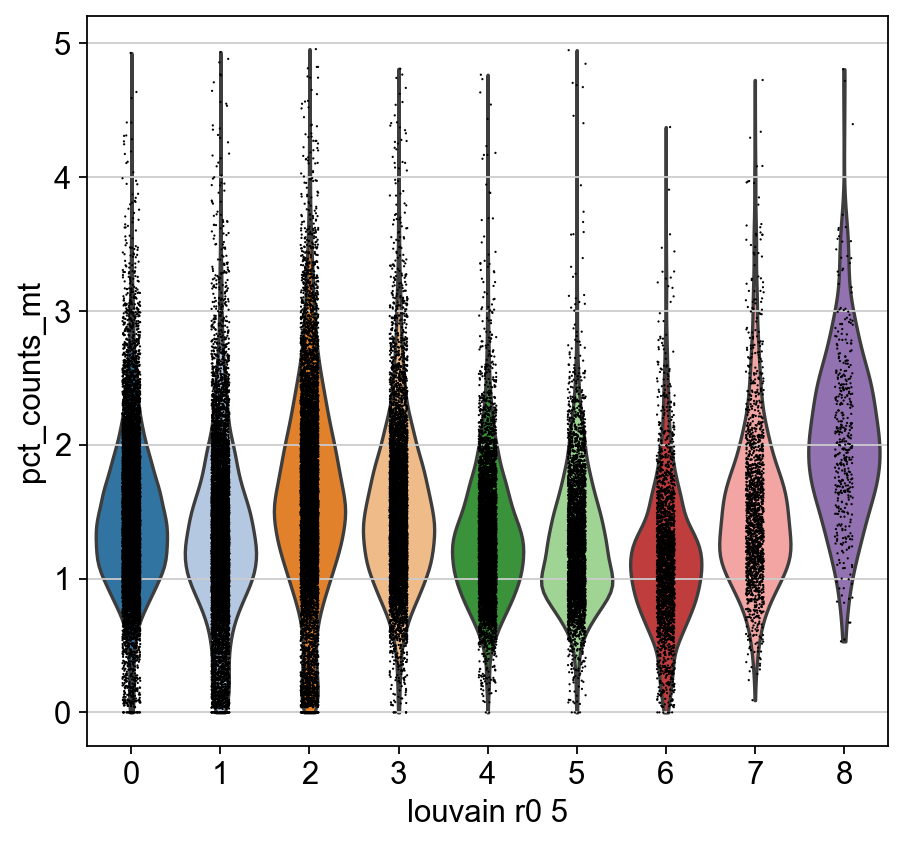

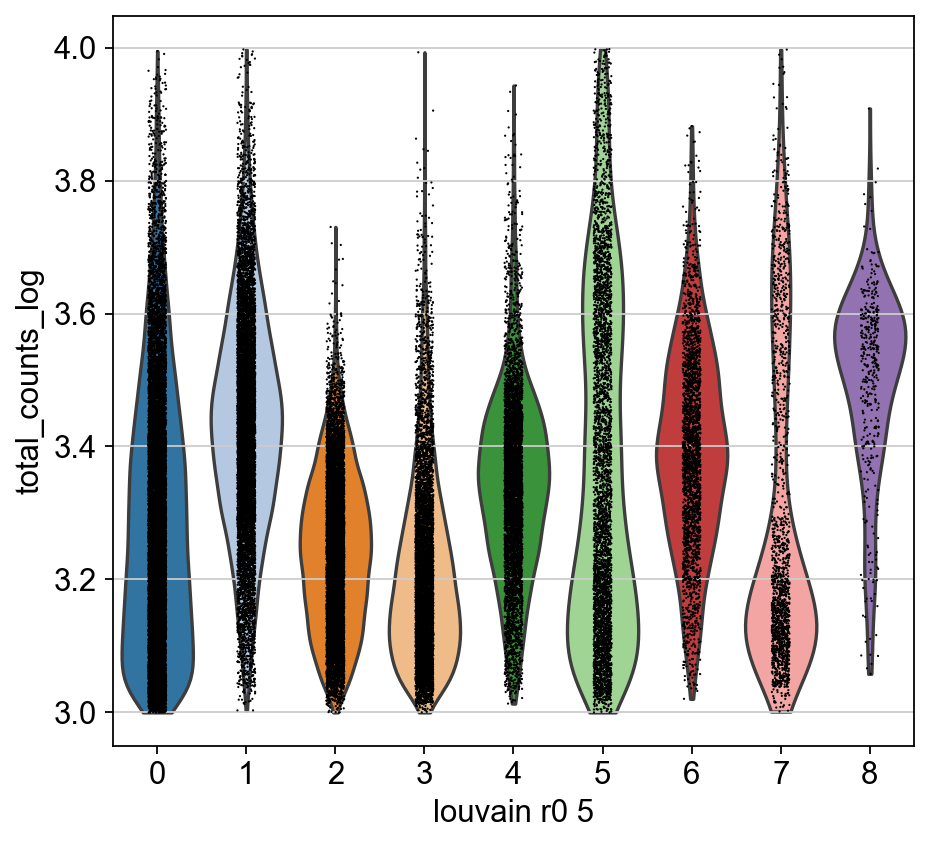

In [34]:
sc.pl.violin(adata, 'pct_counts_mt', groupby='louvain_r0_5')
sc.pl.violin(adata, 'total_counts_log', groupby='louvain_r0_5')

To identify clusters, we now look at known CellType labels. 

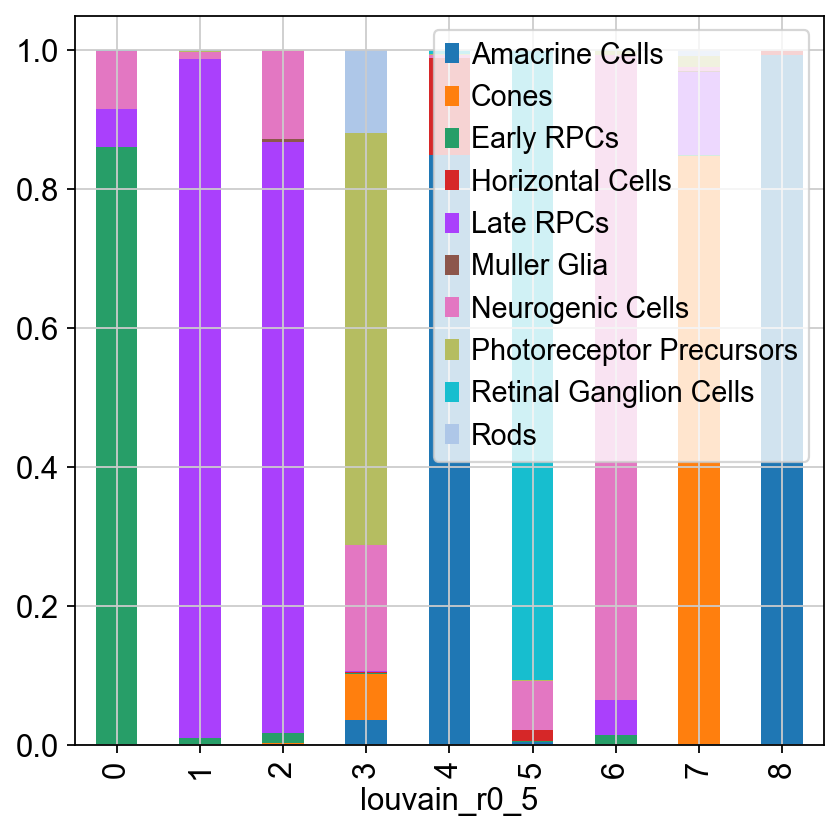

In [35]:
tmp = pd.crosstab(adata.obs['louvain_r0_5'],adata.obs['CellType'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right')


aaa=np.array(tmp)
aai=np.argmax(aaa,axis=1)

The identified cell types are renamed in the full data set.

In [36]:
#Categories to rename
adata.obs['louvain_r0_5'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8'], dtype='object')

In [37]:
keys = adata.obs.louvain_r0_5.cat.categories
values = adata.obs.CellType.cat.categories[aai]
dictionary = dict(zip(keys, values))

adata.obs['louvain_r0_5n'] = (
    adata.obs['louvain_r0_5']
    .map(dictionary)
    .astype('category')
)


In [38]:
adata.obs['louvain_r0_5n'].value_counts()

Late RPCs                   19246
Early RPCs                  12713
Photoreceptor Precursors     6999
Amacrine Cells               5873
Retinal Ganglion Cells       4189
Neurogenic Cells             2448
Cones                        1623
Name: louvain_r0_5n, dtype: int64

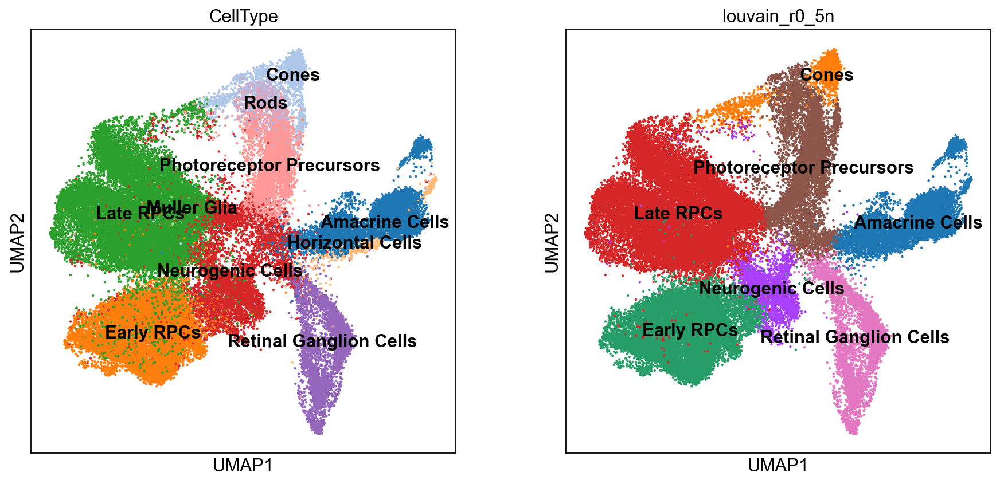

In [39]:
sc.pl.umap(adata, color=['CellType', 'louvain_r0_5n'], size=15, legend_loc='on data')


## 3.3 Subclustering

To build on the basis clustering, we can now subcluster parts of the data to identify substructure within the identified cell types. Here, we subcluster the 'Early RPC' population.

Subclustering is normally performed at a lower resolution than on the entire dataset given that clustering is more sensitive when performed on a small subset of the data.

In [40]:
#Subcluster enterocytes
louv_label='louvain_r0_5n'
clusts_label='Early RPCs'
cluster_new_key=louv_label + '_'+clusts_label
sc.tl.louvain(adata, restrict_to=('louvain_r0_5n', ['Early RPCs']), resolution=0.2, key_added=cluster_new_key)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain_r0_5n_Early RPCs', the cluster labels (adata.obs, categorical) (0:00:01)


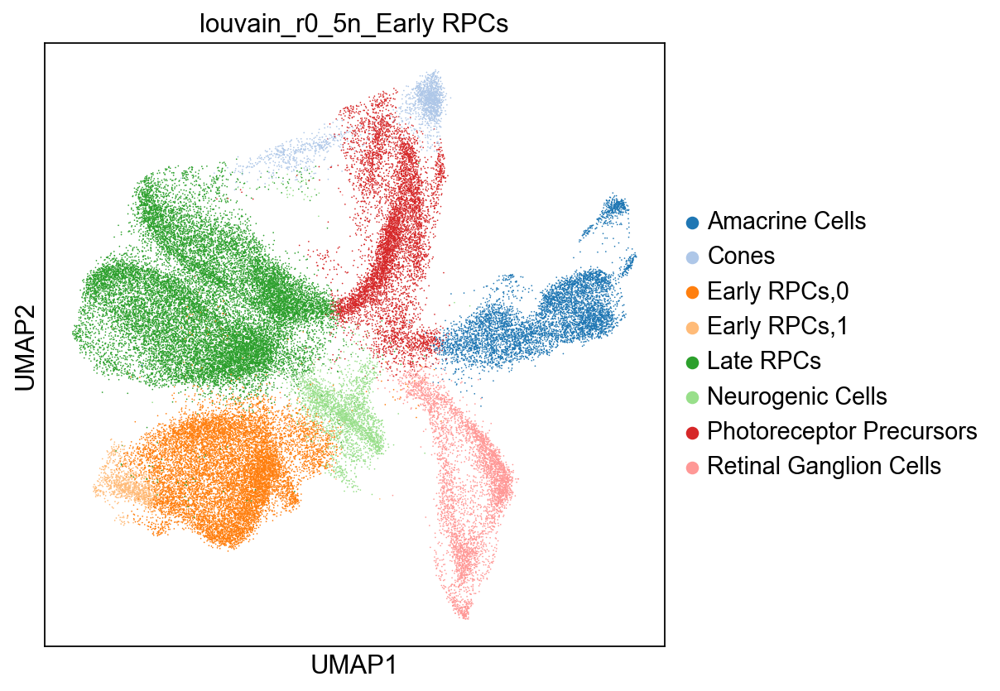

In [41]:
#Show the new clustering
sc.pl.umap(adata, color=cluster_new_key, palette=sc.pl.palettes.vega_20)


The subclustering has identified two subclusters of Early RPCs. 

Marker genes are now computed to verify this observation quantitatively.

In [42]:
#Get the new marker genes
rank_new_key='rank_genes_sub'


sc.tl.rank_genes_groups(adata, groupby=cluster_new_key, key_added=rank_new_key)


ranking genes
    finished: added to `.uns['rank_genes_sub']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


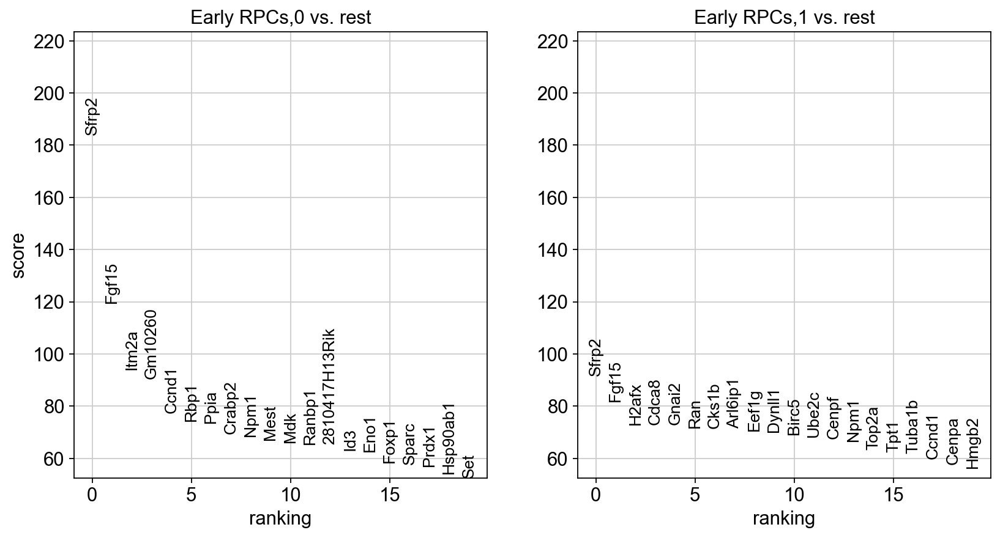

In [43]:
#Plot the new marker genes
ERPC_clusts = [clust for clust in adata.obs[cluster_new_key].cat.categories if clust.startswith('Early RPCs')]
sc.pl.rank_genes_groups(adata, key=rank_new_key, groups=ERPC_clusts, fontsize=12)


In [44]:
pd.DataFrame(adata.uns[rank_new_key]['names'][ERPC_clusts]).head(10)


,"Early RPCs,0","Early RPCs,1"
0,Sfrp2,Sfrp2
1,Fgf15,Fgf15
2,Itm2a,H2afx
3,Gm10260,Cdca8
4,Ccnd1,Gnai2
5,Rbp1,Ran
6,Ppia,Cks1b
7,Crabp2,Arl6ip1
8,Npm1,Eef1g
9,Mest,Dynll1


To see if we can subcluster resulted subclusters further, we can iteratively subcluster.

In [45]:
#Subcluster mature enterocytes
for sub_clusts in ERPC_clusts:
    lovain_key_str='louvain_r0_5n_'+sub_clusts

    sc.tl.louvain(adata, restrict_to=(cluster_new_key, [sub_clusts]), resolution=0.25, key_added=lovain_key_str)
    cluster_new_key=lovain_key_str
    #Show the new clustering
    

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain_r0_5n_Early RPCs,0', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r0_5n_Early RPCs,1', the cluster labels (adata.obs, categorical) (0:00:00)


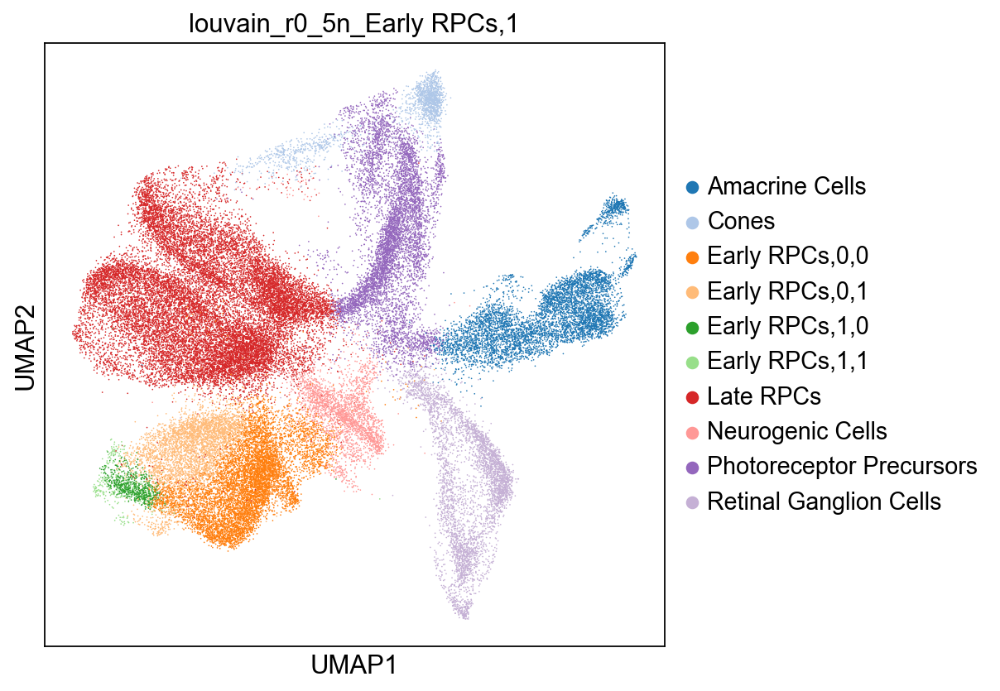

In [46]:
#Show the new clustering
sc.pl.umap(adata, color=lovain_key_str, palette=sc.pl.palettes.vega_20)


In order to find marker genes for subclusters of Early RPC cells, we select out these cells and perform differential gene expression analysis between subclusters of this particular cluster. 

In [47]:
#Get the new marker genes
Er=adata.obs[lovain_key_str].str.startswith('Early')
bdata=adata.copy()
bdata=bdata[Er, :]
rank_key_str='rank_genes_r0.5_sub'
sc.tl.rank_genes_groups(bdata, groupby=lovain_key_str, key_added=rank_key_str)



ranking genes


Trying to set attribute `._uns` of view, copying.


    finished: added to `.uns['rank_genes_r0.5_sub']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


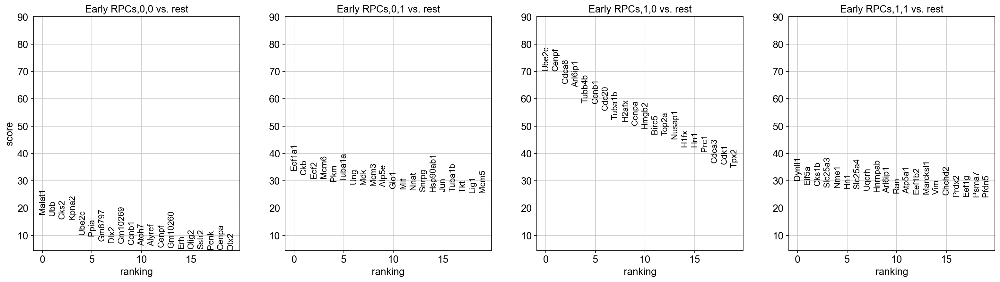

In [48]:
#Plot the new marker genes
sc.pl.rank_genes_groups(bdata,key=rank_key_str, fontsize=12)

In [49]:
ERPC_clusts = [clust for clust in bdata.obs[lovain_key_str].cat.categories if clust.startswith('Early RPCs')]
pd.DataFrame(bdata.uns[rank_key_str]['names'][ERPC_clusts]).head(10)


,"Early RPCs,0,0","Early RPCs,0,1","Early RPCs,1,0","Early RPCs,1,1"
0,Malat1,Eef1a1,Ube2c,Dynll1
1,Ubb,Ckb,Cenpf,Eif5a
2,Cks2,Eef2,Cdca8,Cks1b
3,Kpna2,Mcm6,Arl6ip1,Slc25a3
4,Ube2c,Pkm,Tubb4b,Nme1
5,Ppia,Tuba1a,Ccnb1,Hn1
6,Gm8797,Ung,Cdc20,Slc25a4
7,Dlx2,Mdk,Tuba1b,Uqcrh
8,Gm10269,Mcm3,H2afx,Hnrnpab
9,Ccnb1,Atp5e,Cenpa,Arl6ip1


To visualize that the markers genes we detect are indeed more highly expressed in our cluster compared to background gene expression, we will now plot the last 10 marker genes (numbers 91-100) that we detect per cluster.

We do this to check that there are indeed at least 100 valid marker genes for each cluster, and we don't just detect noise.

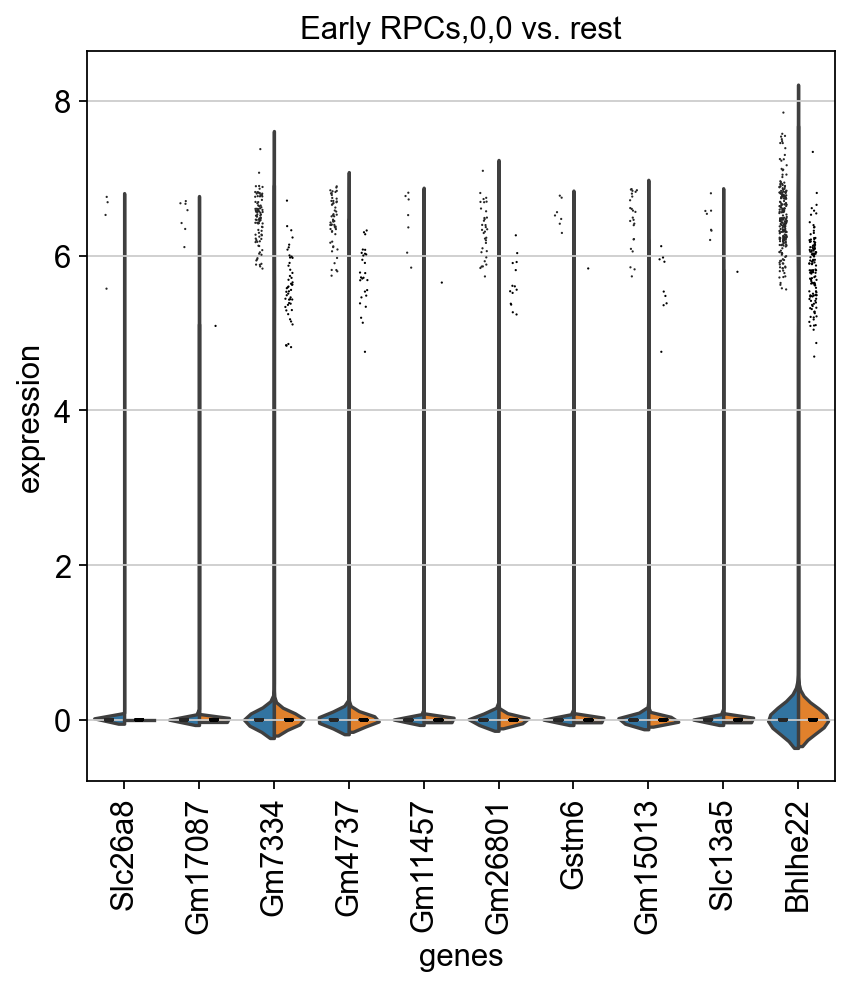

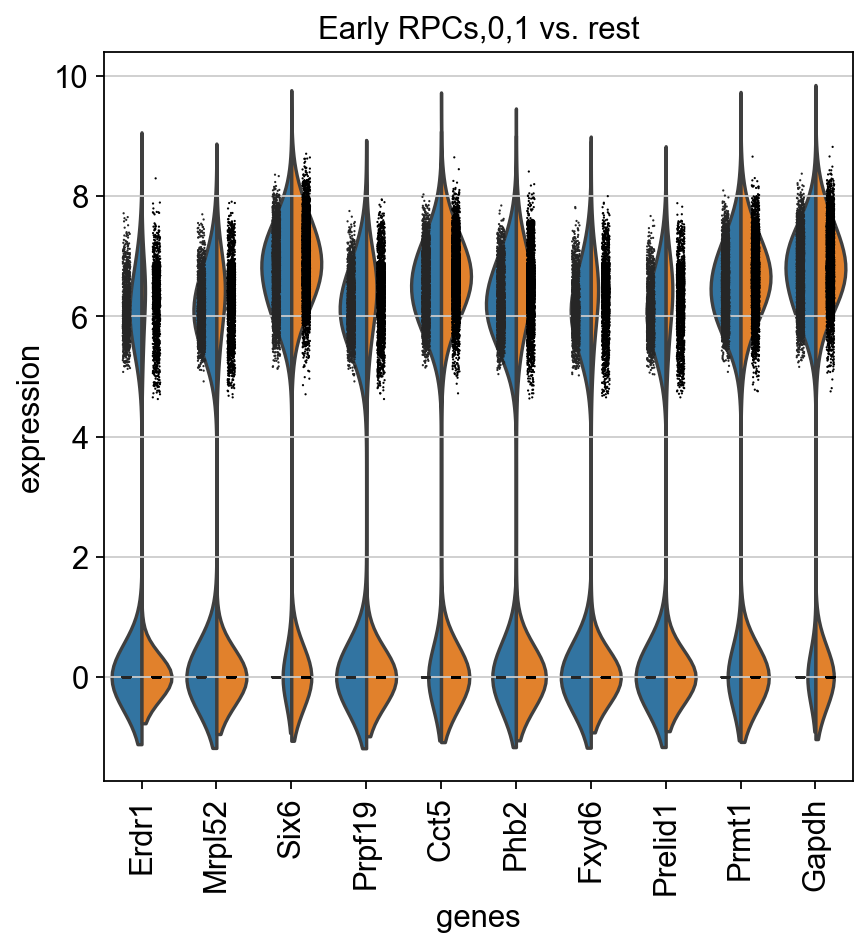

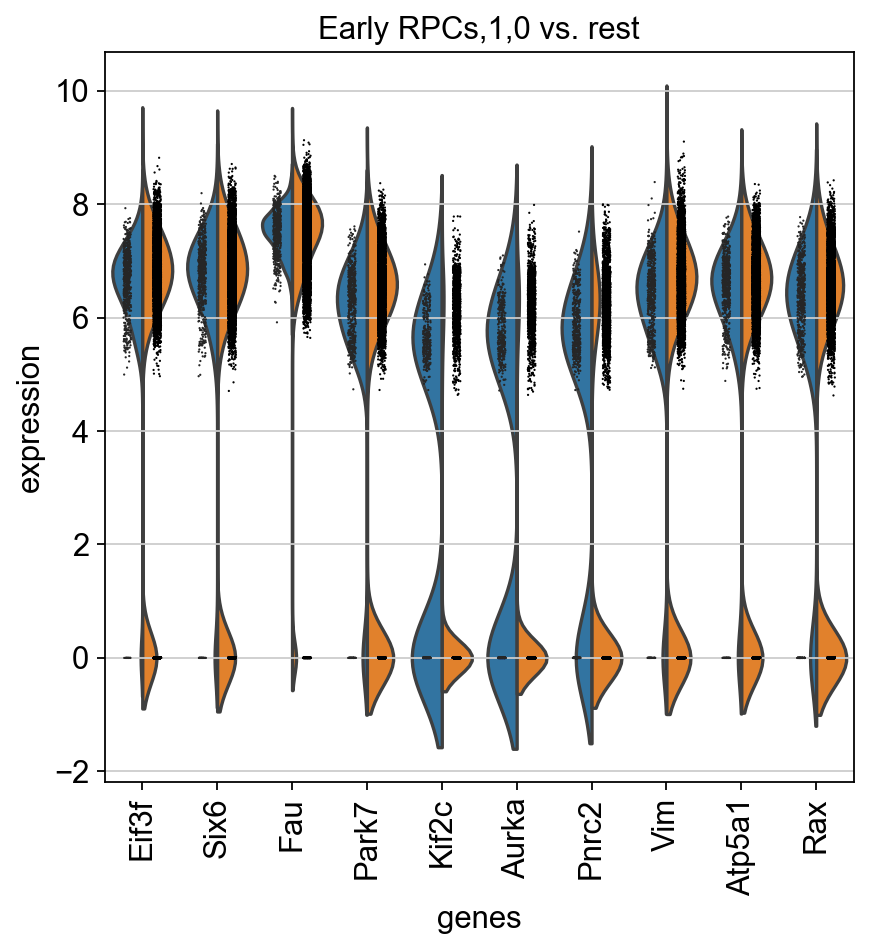

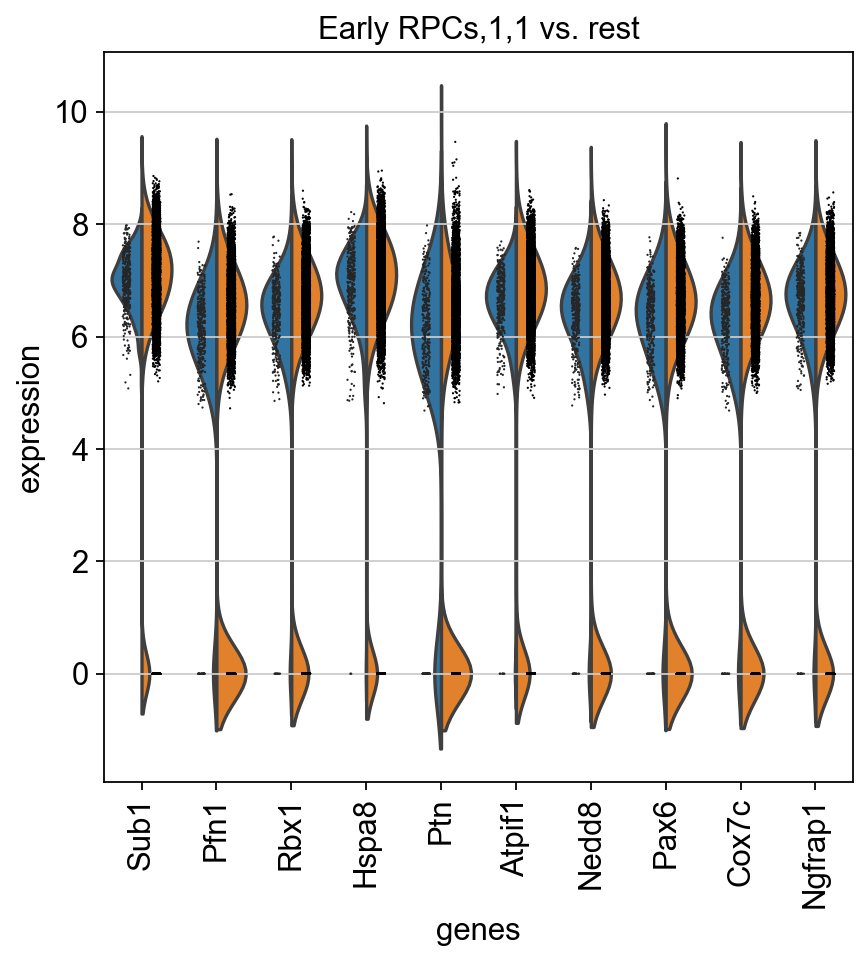

In [50]:
for sub_clusts in ERPC_clusts:
    gene_names_ls=bdata.uns[rank_key_str]['names'][sub_clusts]
    plt.figure()
    sc.pl.rank_genes_groups_violin(bdata, use_raw=True, key=rank_key_str, n_genes =10, groups=[sub_clusts], gene_names=gene_names_ls[90:100])


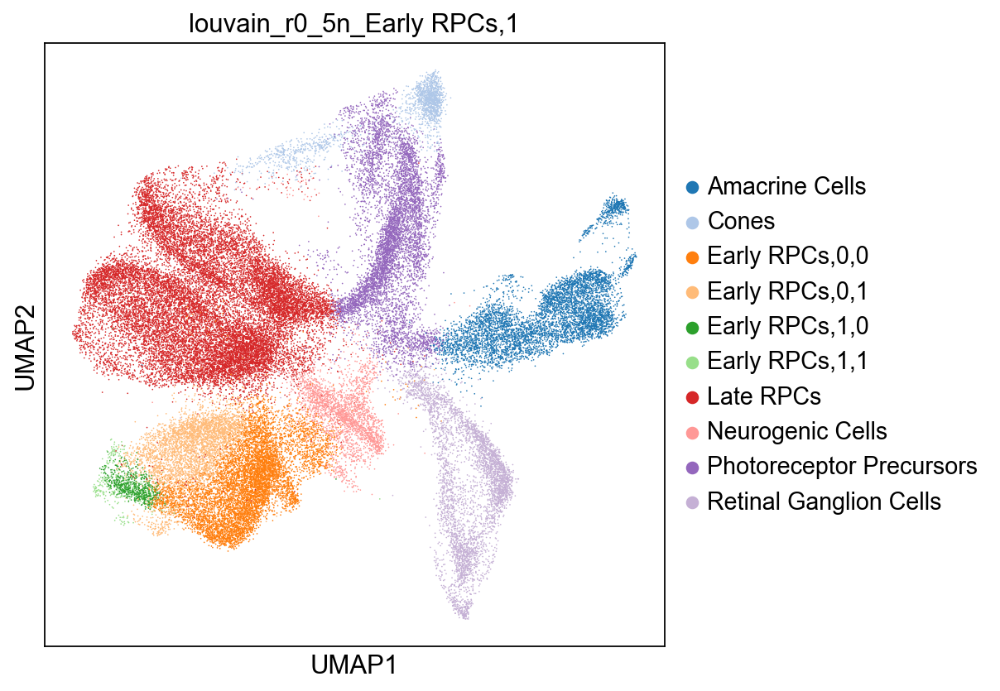

In [51]:
sc.pl.umap(adata, color=lovain_key_str, palette=sc.pl.palettes.vega_20)

In [52]:
adata.obs[lovain_key_str]['names'][ERPC_clusts].value_counts()

KeyError: 'names'

# 4 Summary

In this case study we went through the typical steps of an scRNA-seq data analysis workflow. We started with general preprocessing steps, which included cell and gene quality control, normalization, Batch correction,  selection of highly variable genes, visualization, and cell cycle scoring. In these steps the overall structure of the data is explored and filtered to produce optimal downstream analysis results. In the downstream scRNA-seq analysis section we then used methods to interpret the data and investigate particular parts of it. These steps included clustering and cluster identification via marker genes.

Any individual data analysis script will not always follow all of these steps. For example, trajectory inference may not be relevant where no differentiation processes are captured. Furthermore, a typical analysis will not always traverse the above steps as linearly as shown here. Indeed, all downstream analyses may require going back to tweak or add preprocessing steps to improve the downstream analysis results.

A further aspect we stressed in this case study is that one should take care of which stage of data is being used to perform different analysis steps. Uncorrected, normalized data (or raw counts depending on the tool) are generally used for statistical tests where technical covariates such as batch can be included; corrected data should be used to visually compare results as the human eye will not be able to take into account technical differences that confound the comparison. When computing tests such as differential expression or finding marker genes, it is adviseable to use the full data set that is not restricted to highly variable genes. Taking these considerations into account, and ideally standardizing them across the field, will generate reproducible research.